In [2]:
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt
import os
%matplotlib inline

In [8]:
PATH = '/media/sc-mlsg/T7/Parkinson_data_preprocessed'

inpath = PATH+'/05_Stripped_znormalized'
maskpath = PATH+'/00_Tumor_masks_resampled/'
outpath = PATH+'/quality_check'
os.makedirs(outpath, exist_ok=True)

In [9]:
for (path, dirs, files) in os.walk(inpath):
    print(path, dirs, sorted(files))

/media/sc-mlsg/T7/Parkinson_data_preprocessed/05_Stripped_znormalized ['8403960', '8293319', '8226917', '8225876', '8186725', '8122514', '8119399', '8106080', '8082426', '8064735', '8054712', '7990898', '7988665', '7979586', '7977788', '7960963', '7958827', '7943298', '7941567', '7918223', '7821429', '7803007', '7759921', '7649292', '7242173', '6779695', '5922216', '5906484', '5881096', '5798878', '5767427', '5585087', '5434215', '5354403', '5328768', '5294051', '5120127', '5067132', '4365705', '3963873', '3563464', '3375708', '3157242', '3140501', '3071718', '2974367', '2870096', '2837756', '2816609', '2638793', '2594254', '2450151', '2223305', '1831107', '1531687', '834266', '8270228', '8027947', '7965988', '7958248', '7951885', '7918110', '7899535', '7881790', '7878728', '7867395', '7866364', '7862958', '7862291', '7848365', '7844655', '7839475', '7818794', '7815676', '7780716', '7770400', '7752800', '7746069', '7745513', '7744608', '7741360', '7736223', '7731125', '7712343', '77100

In [5]:
pt_lst = os.listdir('/media/sc-mlsg/T7/Parkinson_data_corrected/')
pt_lst

['1531687',
 '1831107',
 '2223305',
 '2450151',
 '2594254',
 '2638793',
 '2816609',
 '2837756',
 '2870096',
 '2974367',
 '3071718',
 '3140501',
 '3157242',
 '3375708',
 '3563464',
 '3963873',
 '4365705',
 '5067132',
 '5120127',
 '5294051',
 '5328768',
 '5354403',
 '5434215',
 '5585087',
 '5767427',
 '5798878',
 '5881096',
 '5906484',
 '5922216',
 '6779695',
 '7242173',
 '7649292',
 '7759921',
 '7803007',
 '7821429',
 '7918223',
 '7941567',
 '7943298',
 '7958827',
 '7960963',
 '7977788',
 '7979586',
 '7988665',
 '7990898',
 '8054712',
 '8064735',
 '8082426',
 '8106080',
 '8119399',
 '8122514',
 '8186725',
 '8225876',
 '8226917',
 '8293319',
 '8403960']

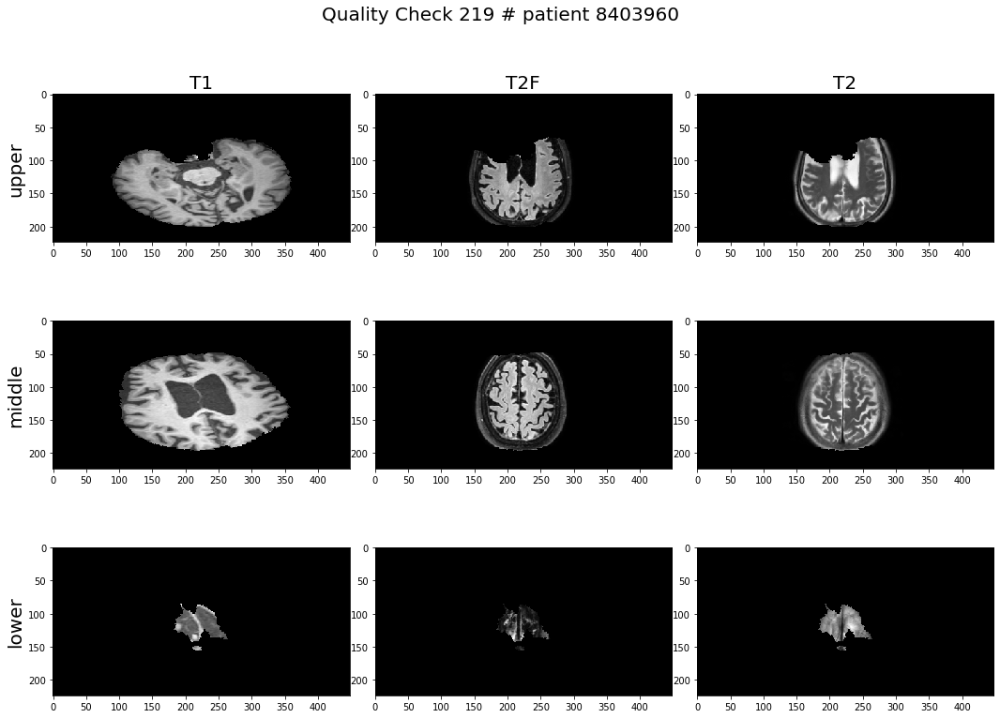

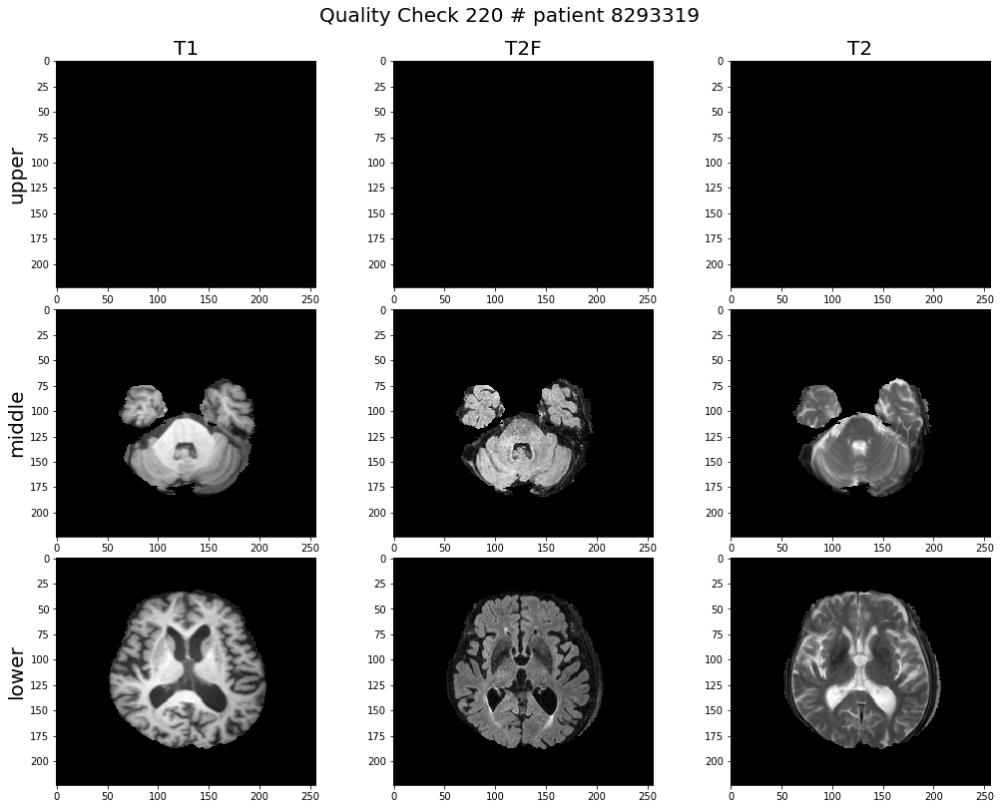

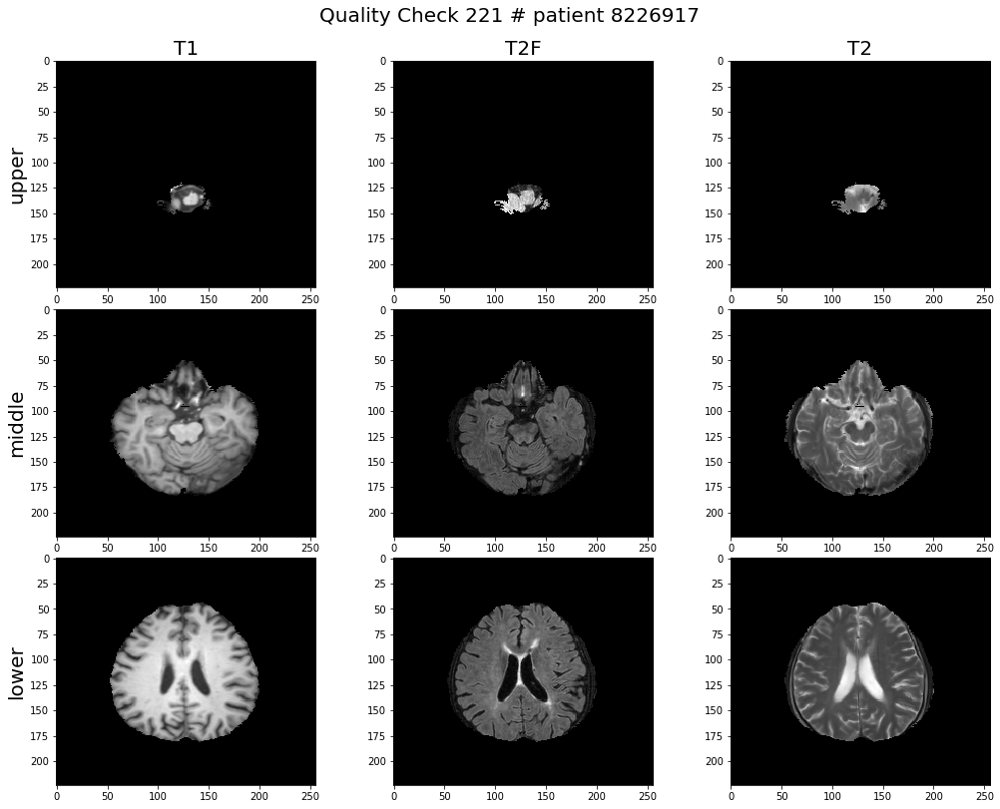

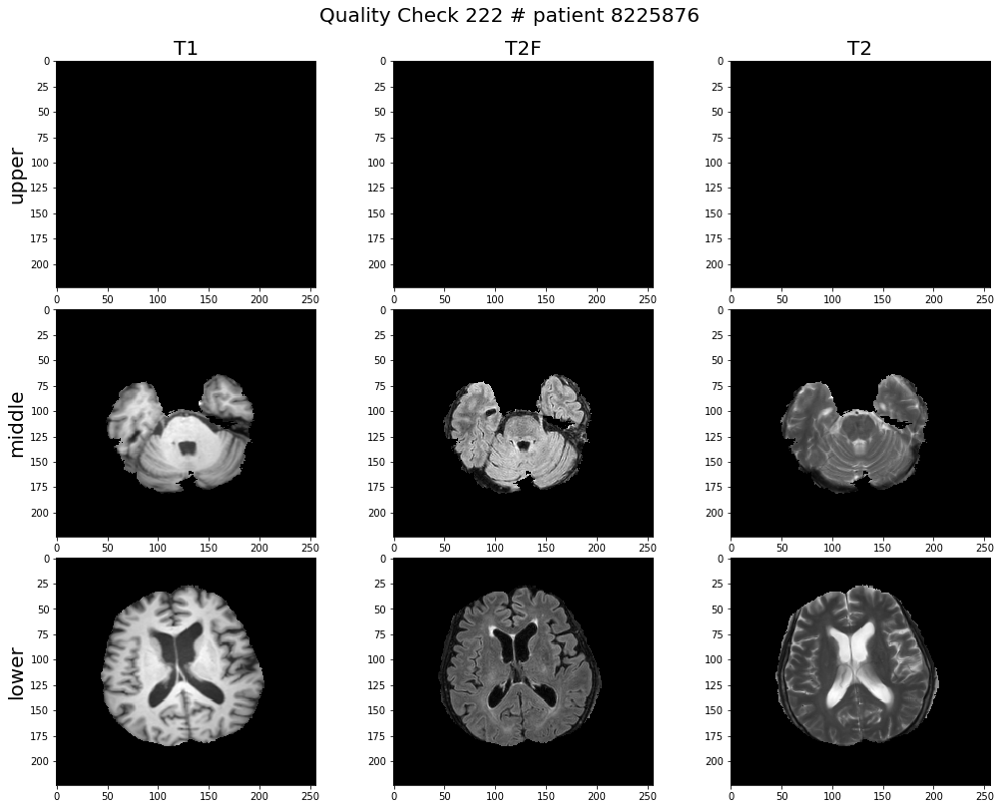

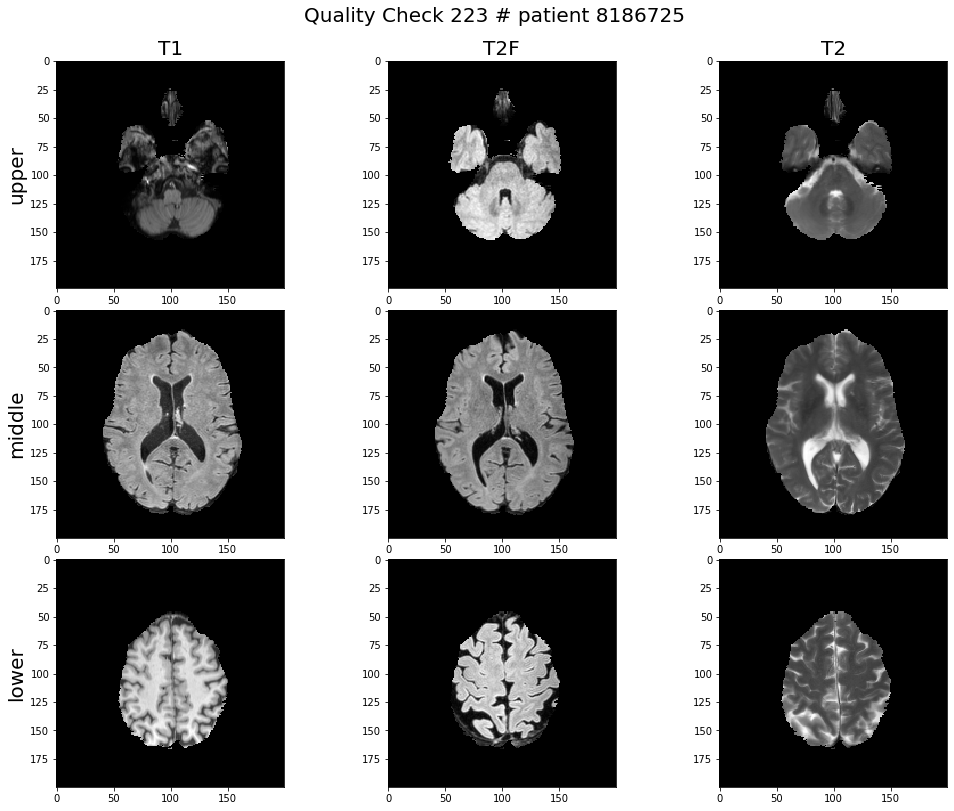

...

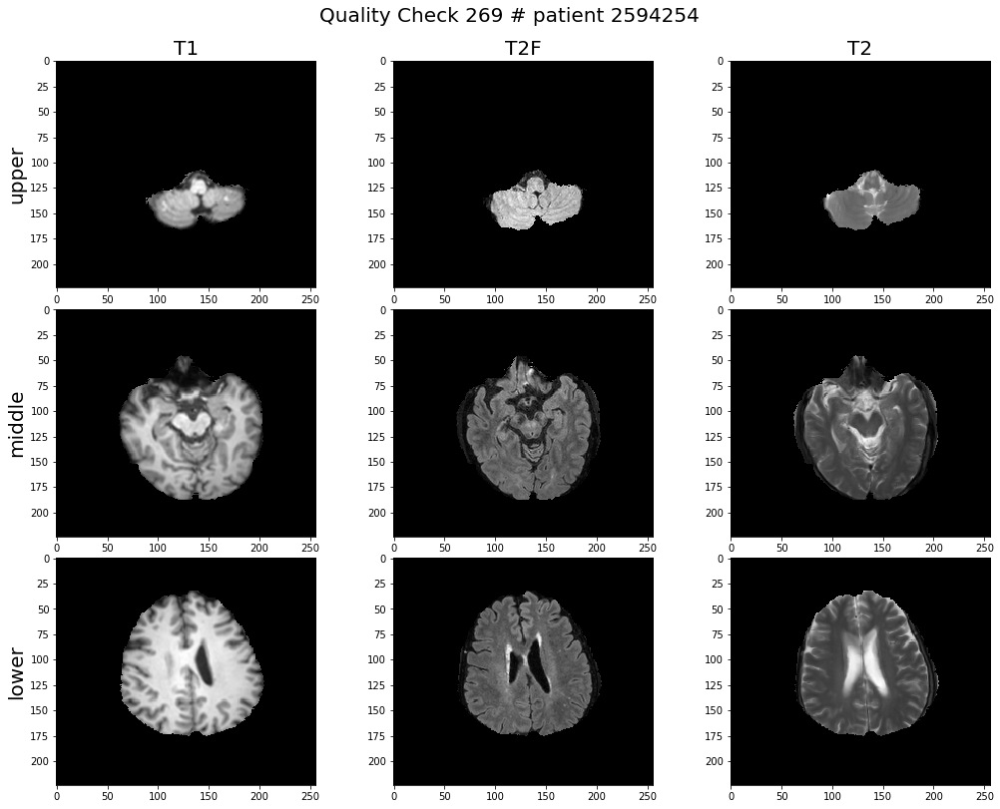

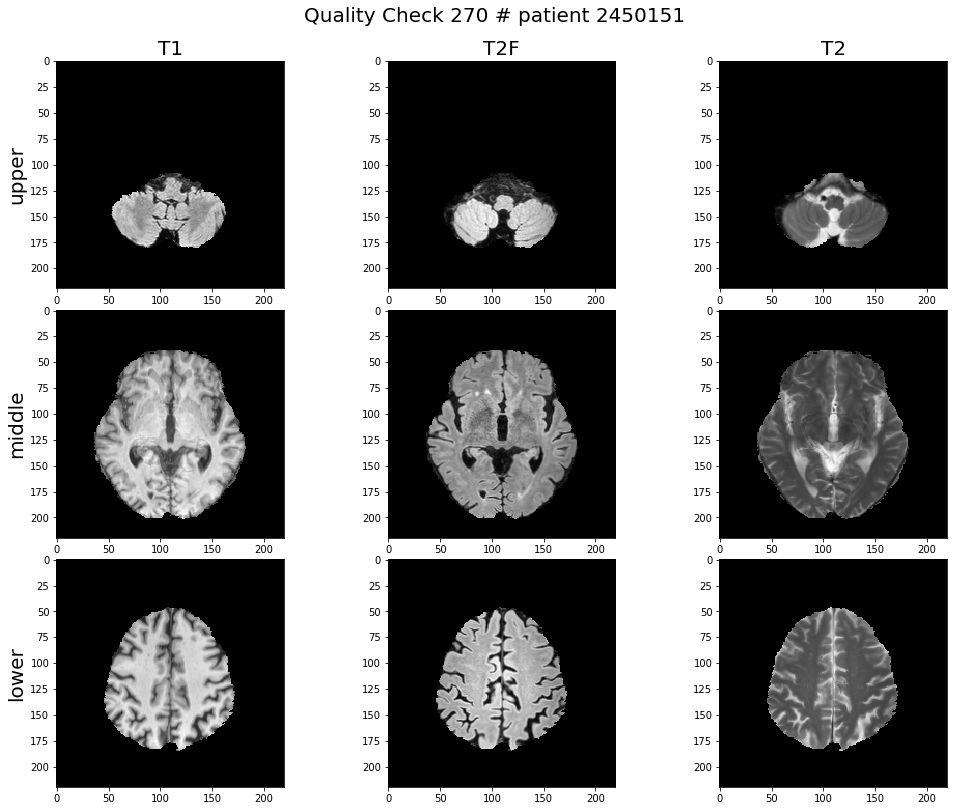

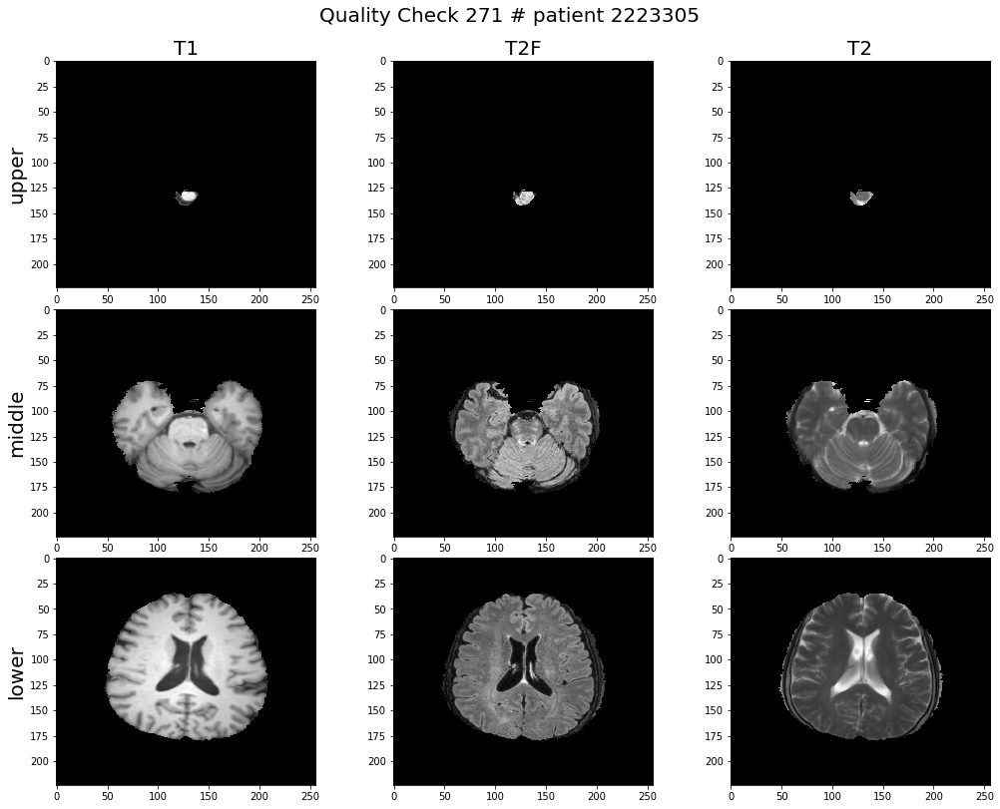

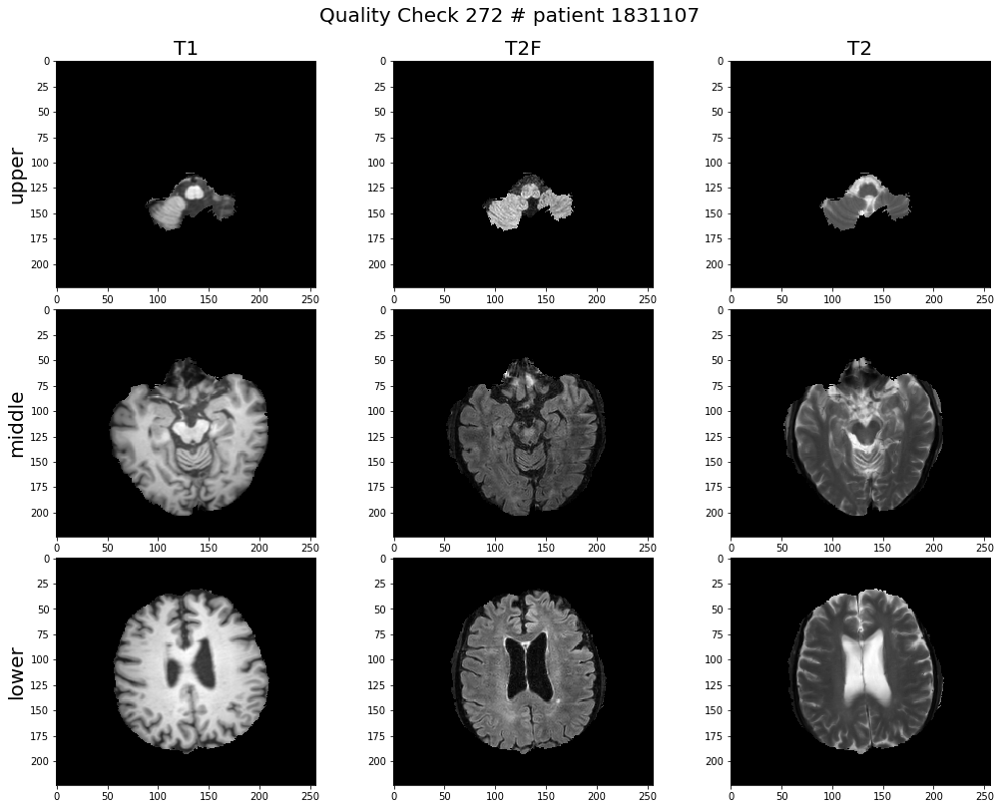

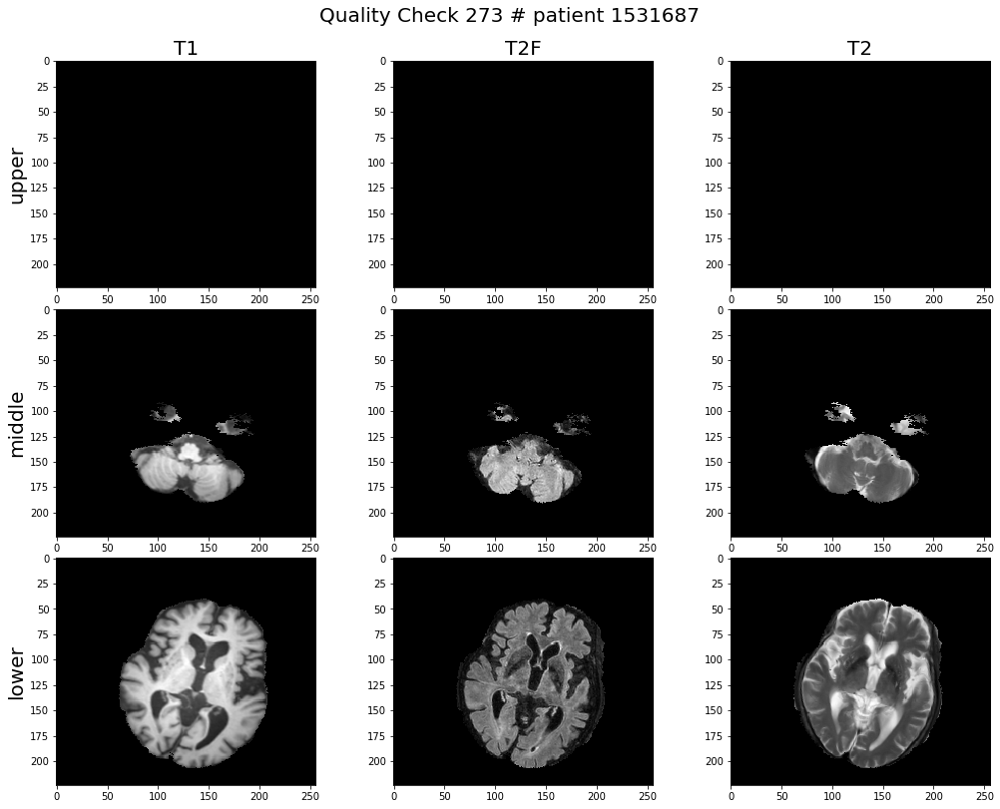

In [12]:
total = 0
rows = ['upper', 'middle', 'lower']
cols = ['T1', 'T2F', 'T2'] #, 'Mask']

for (path, dirs, files) in os.walk(inpath):
    if dirs!=[]:
        continue
    total += 1
    pt = path.split(os.path.sep)[-1]
    if pt not in pt_lst:
        continue
        
    # set figure
    fig, axes = plt.subplots(ncols=len(cols), nrows=len(rows), figsize=(16, 12))
    fig.suptitle("Quality Check {} # patient {}".format(total, pt), fontsize=20)
    
    # load brain img
    for (idx, file) in enumerate(sorted(files)):
        filepath = os.path.join(path, file)
        try:
            seq = file.split("_")[1]
        except:
            seq = file.split(".")[0]
#        print(seq)
        img = nib.load(filepath)
        img_data = img.get_fdata()
        num_slice = img_data.shape[-1]
        for i in range(3):
            axes[i, idx].imshow(img_data[:,:,(num_slice*(i+1))//4].T, cmap="gray")
    #        axes[i, idx].set_title(seq)

    # load mask file
#    maskfile = os.path.join(maskpath, pt, '{}_mask.nii.gz'.format(pt))
#    mask = nib.load(maskfile)
#    mask_data = mask.get_fdata()
#    num_slices = mask_data.shape[-1] 
#    for i in range(3):
#        axes[i, -1].imshow(mask_data[:,:,(num_slices*(i+1))//4].T, cmap="gray")
    
    # set ylabel and title
    for ax, row in zip(axes[:,0], rows):
        ax.set_ylabel(row, rotation=90, fontsize=20)
    for ax, col in zip(axes[0], cols):
        ax.set_title(col, fontsize=20)
    
    plt.tight_layout(pad=5.0, h_pad =0.1, w_pad=0.1)
    plt.savefig(os.path.join(outpath,'{}_QC.png'.format(pt)), pad_inches=0.3)
    plt.show()
